Name: Naseela Pervez

Github Username: Naseela99

USC ID: 3464126446

In [1]:
from tqdm.notebook import tqdm
import pandas as pd
import os,glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFECV
import statsmodels.api as sm
from sklearn . linear_model import LogisticRegression,LogisticRegressionCV
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import StratifiedKFold,GridSearchCV
from sklearn.metrics import plot_roc_curve,confusion_matrix,roc_auc_score,log_loss,accuracy_score
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.utils import shuffle

## 2. Time Series Classification Part 2: Binary and Multiclass Classification

**(a) Binary Classification Using Logistic Regression**

``` The given method breakData divides the data into the desired number of splits using the argument nsplits, adds the class_label to the dataframe and shuffles the dataframe as well. If binary=True, the dataset is labelled as Bending and Not Bending. Otherwise as the activities```

In [2]:
def breakData(path,nsplits=2,binary=False):
    
    col_names = {"avg_rss12":1,
            "var_rss12":2,
            "avg_rss13":3,
            "var_rss13":4,
            "avg_rss23":5,
             "var_rss23":6
            }
    
    dfs=[]
    
    subfolders = ["bending1","bending2","cycling","lying","sitting","standing","walking"]
    
    for folder in tqdm(subfolders):
        files = glob.glob(os.path.join(path,folder,"*"))
        for file in files:
            filename = os.path.basename(file)
            if file=="../data/train/bending2/dataset4.csv":
                df = pd.read_csv('../data/train/bending2/dataset4.csv',skiprows=5,names=["time","avg_rss12","var_rss12","avg_rss13",
                                                "var_rss13","avg_rss23","var_rss23"],sep=" ")
            else:    
                df = pd.read_csv(file
                             ,skiprows=5,names=["time","avg_rss12","var_rss12","avg_rss13",
                                                "var_rss13","avg_rss23","var_rss23"])
            
            
            features = ["avg_rss12","var_rss12","avg_rss13",
                        "var_rss13","avg_rss23","var_rss23"]
            
            new_df = pd.DataFrame()
            
            
            for feature in features:
                
                splits = []
                for split in range(nsplits):
                    start_index = split*(df.shape[0]//nsplits)
                    end_index = (split+1)*(df.shape[0]//nsplits)
                    subsample = df[feature].iloc[start_index:end_index].values
                    new_df[feature+"_"+str(split+1)] = subsample
            new_df["folder"] = folder
            new_df["filename"] = filename
            new_df["label"] = folder
            dfs.append(new_df)

            
    train_df = pd.concat(dfs)    
    train_df = train_df.groupby(["folder","filename"]).agg(
    [("mean",np.mean),
     ("median",np.median),
     ("standard deviation",np.std),
    ],index=True)
    
    
    
    label = []
    for i in range(len(train_df)):
        label.append(train_df.index.values[i][0])
    train_df["label"]=label
    
    
    
    metrics = ["mean","median","standard deviation"]
    final_columns = []
    for col in col_names:
        for split in range(1,nsplits+1):
            for metric in metrics:
                new_column = str(metric)+str(col_names[col])+"_"+str(split)
                final_columns.append(new_column)
    final_columns.append("label")
    train_df.columns = final_columns
    
    if binary:
        color_scheme = []
        for i in range(len(train_df)):
            if train_df["label"].values[i] in ["bending1",'bending2']:
                color_scheme.append('Bending')
            else:
                color_scheme.append("Not Bending")
        train_df["class_label"] = color_scheme
    else:
        color_scheme = []
        for i in range(len(train_df)):
            if train_df["label"].values[i] in ["bending1",'bending2']:
                color_scheme.append('Bending')
            else:
                color_scheme.append(train_df["label"].values[i])
        train_df["class_label"] = color_scheme
        
        

    return shuffle(train_df)
        

***i. Assume that you want to use the training set to classify bending from other
activities, i.e. you have a binary classification problem. Depict scatter plots
of the features you specified in 1(c)iv extracted from time series 1, 2, and 6 of
each instance, and use color to distinguish bending vs. other activities. (See p 129 of the textbook)***

In [3]:
train_df = breakData("../data/train",nsplits=1,binary=True)

  0%|          | 0/7 [00:00<?, ?it/s]

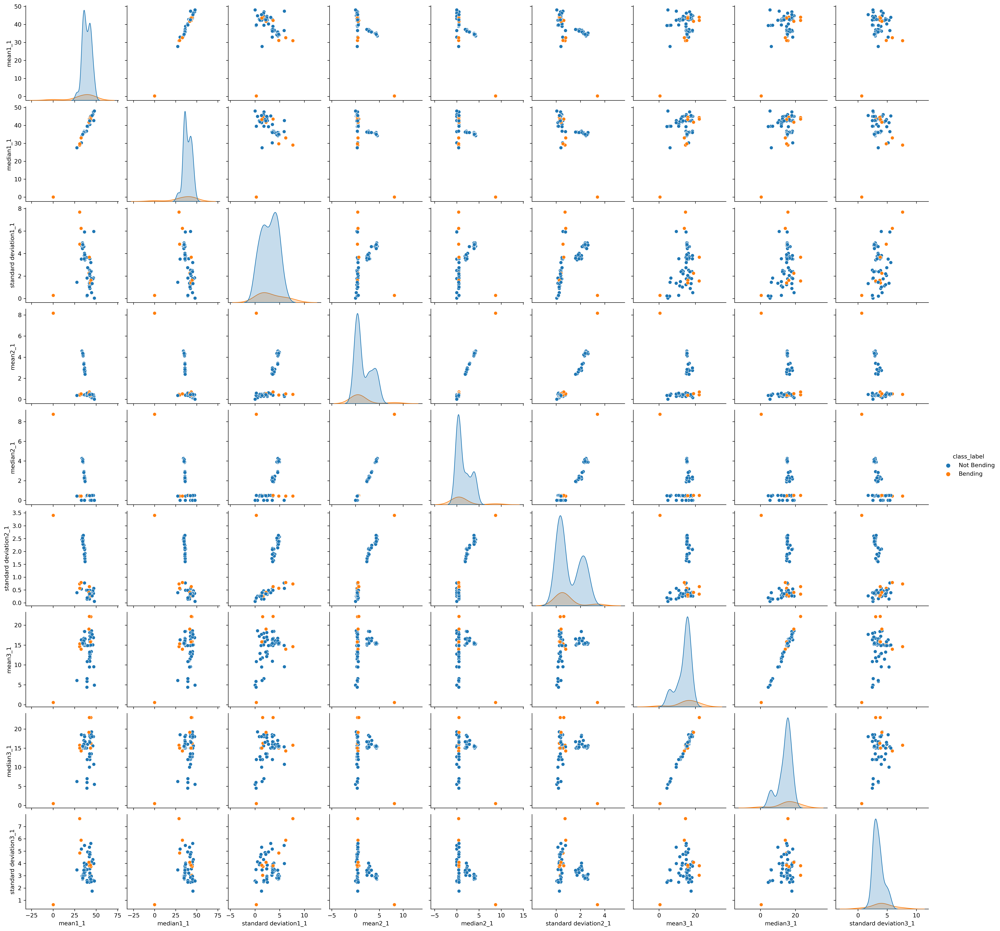

In [4]:
plt.rcParams['figure.dpi'] = 300
sns.pairplot(train_df[["mean1_1","median1_1","standard deviation1_1",
                      "mean2_1","median2_1","standard deviation2_1",
                      "mean3_1","median3_1","standard deviation3_1",'class_label']
                     ], hue= 'class_label')

***ii. Break each time series in your training set into two (approximately) equal length time series. Now instead of 6 time series for each of the training instances, you have 12 time series for each training instance. Repeat the experiment in 2(a)i, i.e depict scatter plots of the features extracted from both parts of the time series 1,2, and 6. Do you see any considerable difference in the results with those of 2(a)i?***

In [5]:
train_df = breakData('../data/train',nsplits = 2,binary=True)

  0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
train_df

mean1_1  median1_1  standard deviation1_1  \
folder   filename                                                     
walking  dataset4.csv   35.236083     36.000               5.057973   
standing dataset15.csv  43.413042     45.000               2.584612   
         dataset8.csv   47.507167     47.500               0.556636   
walking  dataset6.csv   34.737042     35.500               4.276717   
bending2 dataset4.csv    0.298958      0.430               0.299197   
...                           ...        ...                    ...   
bending1 dataset6.csv   44.117042     45.000               1.359836   
sitting  dataset11.csv  45.315000     45.750               2.205981   
walking  dataset7.csv   33.886458     34.375               5.143776   
sitting  dataset14.csv  41.587625     41.500               0.339056   
lying    dataset7.csv   39.527250     39.500               0.138712   

                          mean1_2  median1_2  standard deviation1_2   mean2_1  \
folder   filename                                                               
walking  dataset4.csv   35.150583     35.625               4.434887  4.295417   
standing dataset15.csv  45.469333     45.750               1.706665  0.245167   
         dataset8.csv   46.357250     47.500               2.399503  0.428833   
walking  dataset6.csv   35.134583     35.585               4.989014  4.217333   
bending2 dataset4.csv    0.213917      0.000               0.243590  7.057208   
...                           ...        ...                    ...       ...   
bending1 dataset6.csv   42.792875     42.670               1.058792  0.250042   
sitting  dataset11.csv  42.454667     42.250               3.396238  0.482292   
walking  dataset7.csv   34.779625     35.000               4.714249  4.332208   
sitting  dataset14.csv  43.132750     43.250               0.872216  0.416083   
lying    dataset7.csv   39.340333     39.330               0.224481  0.474250   

                        median2_1  standard deviation2_1   mean2_2  ...  \
folder   filename                                                   ...   
walking  dataset4.csv        3.88               2.710287  4.346625  ...   
standing dataset15.csv       0.00               0.321565  0.448042  ...   
         dataset8.csv        0.50               0.242591  0.430500  ...   
walking  dataset6.csv        4.03               2.337759  4.014167  ...   
bending2 dataset4.csv        6.50               3.611994  9.275292  ...   
...                           ...                    ...       ...  ...   
bending1 dataset6.csv        0.00               0.314099  0.506125  ...   
sitting  dataset11.csv       0.50               0.328552  0.552417  ...   
walking  dataset7.csv        3.90               2.453111  4.461708  ...   
sitting  dataset14.csv       0.47               0.234996  0.548917  ...   
lying    dataset7.csv        0.50               0.096071  0.369958  ...   

                        median5_2  standard deviation5_2   mean6_1  median6_1  \
folder   filename                                                               
walking  dataset4.csv      16.250               3.097099  3.106583      2.870   
standing dataset15.csv     13.500               2.559156  1.179375      0.940   
         dataset8.csv      15.250               2.590296  1.079500      0.830   
walking  dataset6.csv      16.250               3.148561  3.334125      3.000   
bending2 dataset4.csv       0.710               0.322210       NaN        NaN   
...                           ...                    ...       ...        ...   
bending1 dataset6.csv      23.250               1.881721  0.815417      0.710   
sitting  dataset11.csv     12.330               5.438802  1.342000      1.045   
walking  dataset7.csv      15.875               3.389030  3.248417      3.015   
sitting  dataset14.csv     22.000               4.810201  0.798042      0.710   
lying    dataset7.csv      10.290               4.473957  0.522500      0.470   

                  

In [7]:
plt.rcParams['figure.dpi'] = 300
sns.pairplot(train_df[["mean1_1","median1_1","standard deviation1_1",
                     "mean1_2","median1_2","standard deviation1_2",
                     "mean2_1","median2_1","standard deviation2_1",
                     "mean2_2","median2_2","standard deviation2_2",
                     "mean6_1","median6_1","standard deviation6_1",
                     "mean6_2","median6_2","standard deviation6_2","class_label"]], hue= 'class_label')

``` As the number of features are increasing we can see from the plots that there is less linear separability. In the first plot the classes are clearly seperable. However, in the second plot, they are not lnearly separable```

**iii.
Break each time series in your training set into
l
∈ {
1
,
2
, . . . ,
20
}
time series
of approximately equal length and use logistic regression
5
to solve the binary
classification problem, using time-domain features. Remember that breaking
each of the time series does not change the number of instances. It only
changes the number of features for each instance. Calculate the p-values for
your logistic regression parameters in each model corresponding to each value
of
l
and refit a logistic regression model using your pruned set of features.
6
Alternatively, you can use backward selection using sklearn.feature
selection
or glm in R. Use 5-fold cross-validation to determine the best value of the pair
(
l, p
), where
p
is the number of features used in recursive feature elimination.
Explain what the right way and the wrong way are to perform cross-validation
in this problem.
7
Obviously, use the right way! Also, you may encounter the
problem of class imbalance, which may make some of your folds not having
any instances of the rare class. In such a case, you can use
stratifiedcross
validation.
Research what it means and use it if needed.**

In [8]:
def dataPrep(dataframe):
    
    dataframe = dataframe.dropna()
    dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes
    
    y = dataframe['class_label']
    
    x = dataframe.loc[:,dataframe.columns!="class_label"]
    x = x.loc[:,x.columns!="label"]
    x = x.loc[:,x.columns!="instance"]
   
    x.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    
    return x,y

In [9]:
def optl(binary=True,penalized=False):
    l=[]
    p=[]
    cv_score = []
    features = []
    lam =[]
    for i in range(1,21):

        if binary:
            traindf = breakData('../data/train',nsplits=i,binary=True)
        else:
            traindf = breakData('../data/train',nsplits=i)
        x_train,y_train = dataPrep(traindf)
        
        if penalized:
            if binary:
                log_model = LogisticRegression(penalty="l1",
        solver="liblinear",tol=0.001,
        max_iter=int(1e6),
        warm_start=True,
        intercept_scaling=10000.0,)
            else:
                log_model = LogisticRegression(penalty="l1",
                                               tol=0.001,
                                                max_iter=int(1e6),
                                                warm_start=True,
                                                intercept_scaling=10000.0,
                                               multi_class='multinomial',solver="saga",n_jobs=-1)
        
        else: 
            log_model = LogisticRegression(penalty='none',tol=1e-6,max_iter=1000)

        rfe = RFECV(log_model,cv=StratifiedKFold(5))

        rfe.fit(x_train,y_train)
        res = pd.DataFrame()
        res['features'] = x_train.columns
        res['support'] = rfe.support_
        features.append(res[['features'] and res['support']==True ]["features"])
        l.append(i)
        p.append(rfe.n_features_)
        cv_score.append(max(rfe.grid_scores_))


    att_select = pd.DataFrame()
    att_select["l"] = l
    att_select["p"] = p
    att_select["cross validation score"] = cv_score
    att_select["features"] = features
    return att_select

**iv.
Report the confusion matrix and show the ROC and AUC for your classifier
on train data. Report the parameters of your logistic regression
β
i
’s as well
as the p-values associated with them.**

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

9


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.000001
         Iterations: 15
                           Logit Regression Results                           
Dep. Variable:            class_label   No. Observations:                   68
Model:                          Logit   Df Residuals:                       58
Method:                           MLE   Df Model:                            9
Date:                Wed, 22 Jun 2022   Pseudo R-squ.:                   1.000
Time:                        18:36:29   Log-Likelihood:            -4.3877e-05
converged:                      False   LL-Null:                       -24.630
Covariance Type:            nonrobust   LLR p-value:                 1.483e-07
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.9625   2374.546      0.001      0.999   -4651.062    4656.987
mean1_6        5.4879    515.222      0.011      0.992   -1004.32

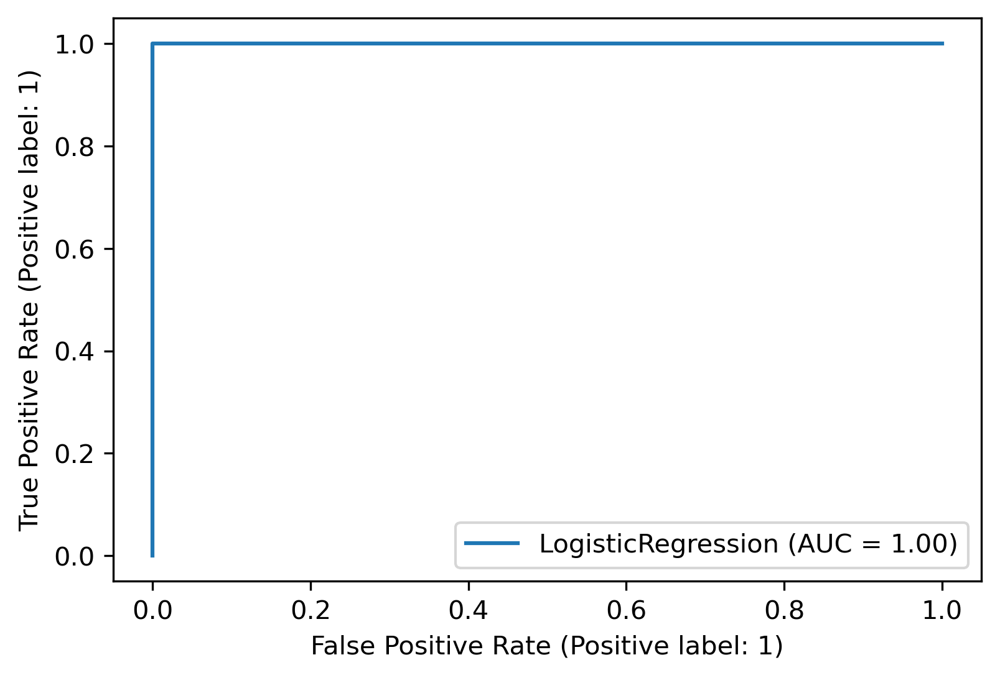

In [10]:
att_select = optl()
ind  = att_select['cross validation score'].idxmax()

l_opt = att_select.loc[ind,'l']
p_opt = att_select.loc[ind,'p']
res = pd.DataFrame()
print(p_opt)

traindf = breakData('../data/train',nsplits=l_opt,binary=True)
x_train,y_train = dataPrep(traindf)


x_tr = x_train[att_select.loc[ind,'features']]
x = sm.add_constant(x_tr)
logit = sm.Logit(y_train,x).fit(maxiter=15)
print(logit.summary())



log_model = LogisticRegression(penalty='none',max_iter=1000).fit(x_tr,y_train)
y_train_pred = log_model.predict(x_tr)
y_train_pred = list(map(round, y_train_pred))
print("\nConfusion Matrix for Test data\n", confusion_matrix(y_train,y_train_pred))
plot_roc_curve(log_model,x_tr,y_train)
print("AUC Score",roc_auc_score(y_train_pred,y_train))



```The wrong way to perform cross validation are as follows:```
- **Not shuffling** the dataset -  if there is a just class 1 at the beggining of our dataframe, the folds of cross validation will not receive well balanced validation set. This way, the pruned features will not be accurate.

- **Not training the model** again after feature selection. The cross validation is used for model selection. This model will always be underft. After we select the model, we must train it again

- Suffling the dataset during the cross validaton at every step. This makes it probable that our validation sets might have similar data points more than once.

```The right approach to cross validation is as follows:```

1.To shuffle the dataset at the beginning of the cross validation.

2. Used StratifiedKFold to have a validation set with balanced classes.

3. Retrained the model to the full training set```

**v.
Test the classifier on the test set. Remember to break the time series in
your test set into the same number of time series into which you broke your
training set. Remember that the classifier has to be tested using the features
extracted from the test set. Compare the accuracy on the test set with the
cross-validation accuracy you obtained previously.**

  0%|          | 0/7 [00:00<?, ?it/s]


Confusion Matrix for Test data
 [[ 3  1]
 [ 0 15]]

AUC Score 0.96875

Accuracy Score of test data 1.0

Accuracy Score of train data 1.0


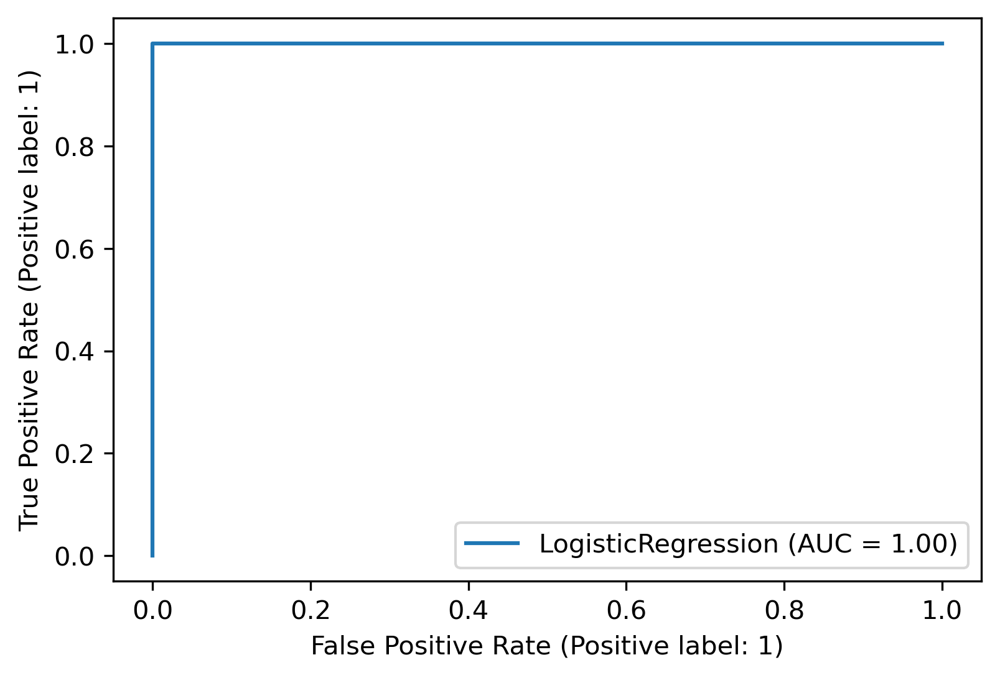

In [11]:

test_data = breakData('../data/test',nsplits=l_opt,binary=True)
x_test,y_test = dataPrep(test_data)

x_te = x_test[att_select.loc[ind,'features']]
y_test_pred = log_model.predict(x_te)
y_test_pred = list(map(round, y_test_pred))

print("\nConfusion Matrix for Test data\n", confusion_matrix(y_test,y_test_pred))
plot_roc_curve(log_model,x_test[att_select.loc[ind,'features']],y_test)
print("\nAUC Score",roc_auc_score(y_test_pred,y_test))

print("\nAccuracy Score of test data",log_model.score(x_te,y_test_pred))
print("\nAccuracy Score of train data",log_model.score(x_tr,y_train))


**vi.
Do your classes seem to be well-separated to cause instability in calculating
logistic regression parameters?**

``` We can see a convergence warning that has been thrown by the classifier. The maximum likelihood optimizer faled to converge. This is because our dataset has well separated dta```

**vii.
From the confusion matrices you obtained, do you see imbalanced classes?
If yes, build a logistic regression model based on case-control sampling and
adjust its parameters. Report the confusion matrix, ROC, and AUC of the
model.**

``` we can clearly see the imbalance in train as well as test set. In the training dataset, there are 60 and 8 datapoints of the two classes respectively. And in the test dataset, there are 15 and 4 datapoints respectively```  

In [12]:
x_tr_cst = sm.add_constant(x_tr)
logit_case_controlled = sm.Logit(y_train,x_tr_cst).fit_regularized(maxiter=50)
logit_case_controlled.summary()

Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.062250389462936e-10
            Iterations: 37
            Function evaluations: 44
            Gradient evaluations: 37


/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1810: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/discrete/discrete_model.py:1863: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            class_label   No. Observations:                   68
Model:                          Logit   Df Residuals:                       58
Method:                           MLE   Df Model:                            9
Date:                Wed, 22 Jun 2022   Pseudo R-squ.:                   1.000
Time:                        18:36:30   Log-Likelihood:            -7.2233e-09
converged:                       True   LL-Null:                       -24.630
Covariance Type:            nonrobust   LLR p-value:                 1.483e-07
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7388        nan        nan        nan         nan         nan
mean1_6        3.3438    3.5e+10   9.55e-11      1.000   -6.86e+10    6.86e+10
mean1_7       -0.6525   6.55e+10  -9.96e-12      1.000   -1.28e+11    1.28e+11
median1_7      3.2464    1.5e+10   2.17e-10      1.000   -2.94e+10    2.94e+10
median3_8      7.2651   8.49e+09   8.56e-10      1.000   -1.66e+10    1.66e+10
mean5_1        1.2850   2.32e+09   5.55e-10      1.000   -4.54e+09    4.54e+09
mean5_2       -0.6373   9.37e+09   -6.8e-11      1.000   -1.84e+10    1.84e+10
median5_2     -5.0140   6.55e+09  -7.66e-10      1.000   -1.28e+10    1.28e+10
mean5_3       -5.5925    9.2e+10  -6.08e-11      1.000    -1.8e+11     1.8e+11
median5_3     -6.2360    9.1e+10  -6.85e-11      1.000   -1.78e+11    1.78e+11
==============================================================================

Complete Separation: The results show that there iscomplete separation.
In this case the Maximum Likelihood Estimator does not exist and the parameters
are not identified.
"""

**(b) Binary Classification Using L1-penalized logistic regression**

**i. Repeat 2(a)iii using L1-penalized logistic regression,8 i.e. instead of using p-
values for variable selection, use L1 regularization. Note that in this problem,
you have to cross-validate for both l, the number of time series into which you
break each of your instances, and λ, the weight of L1 penalty in your logistic
regression objective function (or C, the budget). Packages usually perform cross-validation for λ automatically**

In [13]:
att_select_reg = optl(penalized=True)
ind_reg = att_select_reg['cross validation score'].idxmax()

l_opt_reg = att_select_reg.loc[ind_reg,'l']
p_opt_reg = att_select_reg.loc[ind_reg,'p']

traindf = breakData('../data/train',nsplits=l_opt_reg,binary=True)
x_train,y_train = dataPrep(traindf)


x_tr = x_train[att_select_reg.loc[ind_reg,'features']]
x = sm.add_constant(x_tr)
logit = sm.Logit(y_train,x).fit(maxiter=20)
logit.summary()


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

         Current function value: 0.000000
         Iterations: 20


/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/home/naseela/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            class_label   No. Observations:                   68
Model:                          Logit   Df Residuals:                       65
Method:                           MLE   Df Model:                            2
Date:                Wed, 22 Jun 2022   Pseudo R-squ.:                   1.000
Time:                        18:39:02   Log-Likelihood:            -4.8134e-06
converged:                      False   LL-Null:                       -24.630
Covariance Type:            nonrobust   LLR p-value:                 2.010e-11
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   618.5338   2.13e+04      0.029      0.977    -4.1e+04    4.23e+04
mean5_1                 -23.3592    803.507     -0.029      0.977   -1598.204    1551.486
standard deviation5_1   -37.7000   1309.790     -0.029      0.977   -2604.840    2529.440
=========================================================================================

Complete Separation: The results show that there iscomplete separation.
In this case the Maximum Likelihood Estimator does not exist and the parameters
are not identified.
"""

**ii.
Compare the
L
1
-penalized with variable selection using p-values. Which one
performs better? Which one is easier to implement?**

``` In the Logistic regression that is not penalized, we can clearly see that the p-values are very high(1 or nan). This clearly means that the feature are not significant. In L1-penalized logistic regression also we get the p values which are larger. This implies that the feature are insignificant. However, L1 penalized logistic regression selects less number of features in our case.``` 

**(c) Multi-class Classification (The Realistic Case)**

**i Find the best l in the same way as you found it in 2(b)i to build an L1- penalized multinomial regression model to classify all activities in your training set.
curves are defined for multiclass classification and show them for this problem
if possible**

In [14]:
l=[]
p=[]
cv_score = []
features = []

for i in range(1,21):


    raindf = breakData('../data/train',nsplits=i)
    x_train,y_train = dataPrep(traindf)


       
    log_model = LogisticRegression(penalty="l1",
                                           tol=0.1,
                                            max_iter=int(1e6),
                                            intercept_scaling=10000.0,
                                           multi_class='multinomial',solver="saga",n_jobs=-1)


    rfe = RFECV(log_model,cv=StratifiedKFold(5))

    rfe.fit(x_train,y_train)
    res = pd.DataFrame()
    res['features'] = x_train.columns
    res['support'] = rfe.support_
    features.append(res[['features'] and res['support']==True ]["features"])
    l.append(i)
    p.append(rfe.n_features_)
    cv_score.append(max(rfe.grid_scores_))


att_select = pd.DataFrame()
att_select["l"] = l
att_select["p"] = p
att_select["cross validation score"] = cv_score
att_select["features"] = features



  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/111565626.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df[feature+"_"+str(split+1)] = subsample
/tmp/ipykernel_179320/111565626.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_df["folder"] = folder
/tmp/ipykernel_179320/111565626.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

In [15]:
ind= att_select['cross validation score'].idxmax()

l = att_select.loc[ind_reg,'l']
p = att_select.loc[ind_reg,'p']

traindf = breakData('../data/train',nsplits=l,binary=False)
x_train,y_train = dataPrep(traindf)


x_tr = x_train[att_select.loc[ind,'features']]
multi_lr = LogisticRegression(penalty="l1",
                              tol=1e-6,
                              max_iter=int(1e6),
                              multi_class='multinomial',solver='saga')
multi_lr.fit(x_tr,y_train)

test_data = breakData('../data/test',nsplits=l,binary=False)
x_test,y_test = dataPrep(test_data)
x_te = x_test[att_select.loc[ind,'features']]
y_pred = multi_lr.predict_proba(x_te)
# print(y_pred)
print("Test error for multinomial logistic regression: ",log_loss(y_test,y_pred,labels=[0,1,2,3,4,5]))

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

Test error for multinomial logistic regression:  0.42550591390308506


**ii.
Repeat 2(c)i using a Naıve Bayes’ classifier. Use both Gaussian and Multi- nomial priors and compare the results.**

In [16]:
def optlNB(gaussian=True):
    l_selec = pd.DataFrame()
    l_opts=[]
    error = []
    for i in range(1,21):

        
        traindf = breakData('../data/train',nsplits=i)
        x_train,y_train = dataPrep(traindf)
        
        test_data = breakData('../data/test',nsplits=i,binary=False)
        x_test,y_test = dataPrep(test_data)
        
        if gaussian:
            model = GaussianNB()
        else:
            model = mnb = MultinomialNB()
        
        model.fit(x_train,y_train)
        err = log_loss(y_test,model.predict_proba(x_test),labels=[0,1,2,3,4,5])
        error.append(err)
        l_opts.append(i)
            
        
        l_selec['l'] = l_opts
        l_selec['error'] = error
        return l_selec

In [17]:
l_selector = optlNB()

ind = l_selector['error'].idxmin()
l = l_selector.loc[ind,'l']

traindf = breakData('../data/train',nsplits=l,binary=False)
x_train,y_train = dataPrep(traindf)

gn = GaussianNB()
gn.fit(x_train,y_train)

test_data = breakData('../data/test',nsplits=l,binary=False)
x_test,y_test = dataPrep(test_data)


y_pred_gnb = gn.predict_proba(x_test)
print("Test error for Gaussian Naive Bayes: ",log_loss(y_test,y_pred_gnb,labels=[0,1,2,3,4,5]))

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

Test error for Gaussian Naive Bayes:  0.9958257322863603


In [18]:
l_selector = optlNB(gaussian=False)

ind = l_selector['error'].idxmin()
l = l_selector.loc[ind,'l']


traindf = breakData('../data/train',nsplits=l,binary=False)
x_train,y_train = dataPrep(traindf)
mnb = MultinomialNB()

mnb.fit(x_train,y_train)
test_data = breakData('../data/test',nsplits=l,binary=False)
x_test,y_test = dataPrep(test_data)

y_pred_mnb = mnb.predict_proba(x_test)

print("Test error for Multinomial Naive Bayes: ",log_loss(y_test,y_pred_mnb,labels=[0,1,2,3,4,5]))

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_179320/1071383426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['class_label'] = dataframe.loc[:,'class_label'].astype('category').cat.codes


  0%|          | 0/7 [00:00<?, ?it/s]

Test error for Multinomial Naive Bayes:  0.3146410179746301


 - The test error for multinomial Naive Bayes is the least. 
 - Gaussian Naive Bayes performs better than Multinomial logistic regression

## 3. ISLR, 4.8.3

**3. This problem relates to the QDA model, in which the observations within each class are drawn from a normal distribution with a class- specific mean vector and a class specific covariance matrix. We consider the simple case where p = 1; i.e. there is only one feature.
Suppose that we have K classes, and that if an observation belongs to the kth class then X comes from a one-dimensional normal distribution, X ∼ N(μk,σk2). Recall that the density function for the one-dimensional normal distribution is given in (4.16). Prove that in this case, the Bayes classifier is not linear. Argue that it is in fact quadratic.
Hint: For this problem, you should follow the arguments laid out in
22 Section 4.4.1, but without making the assumption that σ1 = . . . = σK .**

We know from Bayes rule that, $p_k(x) = \frac{\pi_k  f_k(x)}{ \Sigma \pi_l f_l(x)}$

And given that $f_k(x) = \frac{1}{\sqrt{2\pi} \sigma_k} e^{{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}$

We know $p_k(x) = \frac{\pi_k  \frac{1}{\sqrt{2\pi} \sigma_k} e^{{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}}{ \Sigma \pi_l \frac{1}{\sqrt{2\pi} \sigma_l} e^{{\frac{-1}{2\sigma_l^2}}{(x-\mu_l)^2}}}$

Taking log on both sides,

$\log{p_k(x)} = \log{\frac{\pi_k  \frac{1}{\sqrt{2\pi} \sigma_k} e^{{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}}{ \Sigma \pi_l \frac{1}{\sqrt{2\pi} \sigma_l} e^{{\frac{-1}{2\sigma_l^2}}{(x-\mu_l)^2}}}}$

```Ignoring the terms that are not a function of k and taking log```

$\implies \log{p_k(x)} = \log{{\pi_k  \frac{1}{\sqrt{2\pi} \sigma_k} e^{{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}}-\log{ \Sigma \pi_l \frac{1}{\sqrt{2\pi} \sigma_l} e^{{\frac{-1}{2\sigma_l^2}}{(x-\mu_l)^2}}}} $

$\implies \delta_k = \log{{\pi_k  \frac{1}{\sqrt{2\pi} \sigma_k} e^{{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}}}$

$\implies \delta_k = \log{{\pi_k} +\log{\frac{1}{\sqrt{2\pi}\sigma_k}} + {{\frac{-1}{2\sigma_k^2}}{(x-\mu_k)^2}}}$

$\implies \delta_k = \log{{\pi_k} +\log{\frac{1}{\sqrt{2\pi}\sigma_k}} + {{\frac{-1}{2\sigma_k^2}}{(x^2+\mu_k^2 - 2x\mu_k)}}}$

$\implies \delta_k = \log{\pi_k} +\log{\frac{1}{\sqrt{2\pi}\sigma_k}} + \frac{x^2}{2\sigma_k^2} + \frac{\mu_k^2}{2\sigma_k^2} - \frac{x\mu_k}{2\sigma_k^2}$

**We can clearly see that Bayes classifier in this case is not linear.**

## 4. ISLR 4.8.7

**7. Suppose that we wish to predict whether a given stock will issue a dividend this year (“Yes” or “No”) based on X, last year’s percent profit. We examine a large number of companies and discover that the
 ̄
while the mean for those that didn’t was X = 0. In addition, the variance of X for these two sets of companies was σˆ2 = 36. Finally, 80 % of companies issued dividends. Assuming that X follows a nor- mal distribution, predict the probability that a company will issue a dividend this year given that its percentage profit was X = 4 last year.
Hint: Recall that the density function for a normal random variable is f(x) = √2πσ2 e
. You will need to use Bayes’ theorem**

We know from Bayes rule that, $p_k(x) = \frac{\pi_k  f_k(x)}{ \Sigma \pi_l f_l(x)} for k=[y,n]$

$\pi_y = 0.8 \pi_n=0.2$

$\sigma_y^2 = \sigma_n^2 = 36$

$\mu_y = 10$   $\mu_n = 0$

```Plugging in the values```

$p_y(x=4) = \frac{\pi_y  f_y(x)}{\pi_y f_y(x) + \pi_n f_n(x)}$

$p_y(x=4) = \frac{\pi_y  f_y(x)}{\pi_y f_y(x) + \pi_n f_n(x)}$

$f_y(x=4) = \frac{1}{\sqrt{2\pi\sigma_y^2} e^{{\frac{-1}{2\sigma_y^2}}{(x-\mu_y)^2}}}$

$f_y(x=4) = \frac{1}{\sqrt{2\pi*36} e^{{\frac{-1}{2*36}}{(4-10)^2}}} = 0.0812$

$f_n(x=4) = \frac{1}{\sqrt{2\pi*36} e^{{\frac{-1}{2*36}}{(4-0)^2}}} = 0.1036$

$p_y(x=4) = \frac{0.80*0.0812}{(0.80*0.0812) + (0.20*0.1036)} = 0.7581$

**This implies that the probability that the given stock will be dividended given x=4 is 75.81%**